# Pedestrian detection within individual frames of video

### This notebook will use the object identification from the Pedestrian detection notebook 
- A selected video will be broken into frames
- The pedestrians will be identified and logged
- coordinates of bounding box will be tracked for 6 frames
- Algorithim will try to predict where the pedestrian will be 6 frames from the current frame

This is notebook 2 and will take a chosen video and break it down into frames. The frames will then be fed into the model to detect objects within. 

In [1]:
import os
import sys
import numpy as np
np.random.seed(0)
import matplotlib.pyplot as plt
import cv2
import json
import re

%matplotlib inline 

# Root directory of the project
ROOT_DIR = os.path.abspath("../")
print("Root Directory: ", ROOT_DIR)
sys.path.append(ROOT_DIR)

from mrcnn import utils
import mrcnn.model as modellib
from mrcnn import visualize
from mrcnn.model import log

from scripts import coco
from scripts import list_file_info as lfi

Root Directory:  /home/sam/Documents/GitHub/honoursProject/PedestrianDetectionSGall


In [2]:
vid_dir = "/home/sam/Desktop/sam_bdd_videos/videos_for_frames/1/video/"
frames_dir = "/home/sam/Desktop/sam_bdd_videos/videos_for_frames/1/frames/"
output_dir = "/home/sam/Desktop/sam_bdd_videos/videos_for_frames/1/output_vid/"
final_imgs_dir = "/home/sam/Desktop/sam_bdd_videos/videos_for_frames/1/output_img/"
json_output_dir = "/home/sam/Desktop/sam_bdd_videos/videos_for_frames/1/output_json/"

In [3]:
class InferenceConfig(coco.CocoConfig):
    # Set batch size to 1 since we'll be running inference on
    # one image at a time. Batch size = GPU_COUNT * IMAGES_PER_GPU
    GPU_COUNT = 1
    IMAGES_PER_GPU = 1

# Device to load the neural network on.
# Useful if you're training a model on the same 
# machine, in which case use CPU and leave the
# GPU for training.
DEVICE = "/gpu:0"  # /cpu:0 or /gpu:0

In [4]:
# Directory to save logs and trained model
MODEL_DIR = os.path.join(ROOT_DIR, "logs")

# Local path to trained weights file
COCO_MODEL_PATH = os.path.join(ROOT_DIR, "weights/mask_rcnn_coco.h5")
# Download COCO trained weights from Releases if needed
if not os.path.exists(COCO_MODEL_PATH):
    utils.download_trained_weights(COCO_MODEL_PATH)

class_names = ['BG', 'person', 'bicycle', 'car', 'motorcycle', 'airplane',
                'bus', 'train', 'truck', 'boat', 'traffic light',
                'fire hydrant', 'stop sign', 'parking meter', 'bench', 'bird',
                'cat', 'dog', 'horse', 'sheep', 'cow', 'elephant', 'bear',
                'zebra', 'giraffe', 'backpack', 'umbrella', 'handbag', 'tie',
                'suitcase', 'frisbee', 'skis', 'snowboard', 'sports ball',
                'kite', 'baseball bat', 'baseball glove', 'skateboard',
                'surfboard', 'tennis racket', 'bottle', 'wine glass', 'cup',
                'fork', 'knife', 'spoon', 'bowl', 'banana', 'apple',
                'sandwich', 'orange', 'broccoli', 'carrot', 'hot dog', 'pizza',
                'donut', 'cake', 'chair', 'couch', 'potted plant', 'bed',
                'dining table', 'toilet', 'tv', 'laptop', 'mouse', 'remote',
                'keyboard', 'cell phone', 'microwave', 'oven', 'toaster',
                'sink', 'refrigerator', 'book', 'clock', 'vase', 'scissors',
                'teddy bear', 'hair drier', 'toothbrush']

config = InferenceConfig()
config.display()


Configurations:
BACKBONE                       resnet101
BACKBONE_STRIDES               [4, 8, 16, 32, 64]
BATCH_SIZE                     1
BBOX_STD_DEV                   [0.1 0.1 0.2 0.2]
COMPUTE_BACKBONE_SHAPE         None
DETECTION_MAX_INSTANCES        100
DETECTION_MIN_CONFIDENCE       0.7
DETECTION_NMS_THRESHOLD        0.3
FPN_CLASSIF_FC_LAYERS_SIZE     1024
GPU_COUNT                      1
GRADIENT_CLIP_NORM             5.0
IMAGES_PER_GPU                 1
IMAGE_CHANNEL_COUNT            3
IMAGE_MAX_DIM                  1024
IMAGE_META_SIZE                93
IMAGE_MIN_DIM                  800
IMAGE_MIN_SCALE                0
IMAGE_RESIZE_MODE              square
IMAGE_SHAPE                    [1024 1024    3]
LEARNING_MOMENTUM              0.9
LEARNING_RATE                  0.001
LOSS_WEIGHTS                   {'rpn_class_loss': 1.0, 'rpn_bbox_loss': 1.0, 'mrcnn_class_loss': 1.0, 'mrcnn_bbox_loss': 1.0, 'mrcnn_mask_loss': 1.0}
MASK_POOL_SIZE                 14
MASK_SHAPE         

In [5]:
# Create model object in inference mode.
model = modellib.MaskRCNN(mode="inference", model_dir=MODEL_DIR, config=config)

print("Loading weights ", COCO_MODEL_PATH)

# Load weights trained on MS-COCO
model.load_weights(COCO_MODEL_PATH, by_name=True)

2022-03-15 17:15:47.147619: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:936] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-03-15 17:15:47.288892: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:936] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-03-15 17:15:47.289060: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:936] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-03-15 17:15:47.290645: I tensorflow/core/platform/cpu_feature_guard.cc:151] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags

Instructions for updating:
Use fn_output_signature instead
Loading weights  /home/sam/Documents/GitHub/honoursProject/PedestrianDetectionSGall/weights/mask_rcnn_coco.h5


In [6]:
# Get video file name 

vid_name = lfi.get_file_name(vid_dir)

video_path = vid_dir + vid_name
print(video_path)

/home/sam/Desktop/sam_bdd_videos/videos_for_frames/1/video/cadf77c3-2857db38.mov


In [7]:
# Break video down into frames

cap = cv2.VideoCapture(video_path)
i = 0
while cap.isOpened():
    ret, image = cap.read()
    if ret == False:
        break
    cv2.imwrite(os.path.join(frames_dir, str(i) + ".jpg"), image)
    i += 1
cap.release()
cv2.destroyAllWindows()

In [8]:
# Create collection for frame names in frames_dir

frames_list = lfi.get_file_names(frames_dir)

# Sort the frames into accending order

frames_list.sort(key=lambda f: int(re.sub('\D', '', f)))

/home/sam/Desktop/sam_bdd_videos/videos_for_frames/1/frames/0.jpg
Processing 1 images
image                    shape: (720, 1280, 3)        min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 93)               min:    0.00000  max: 1280.00000  float64
anchors                  shape: (1, 261888, 4)        min:   -0.35390  max:    1.29134  float32
/home/sam/Desktop/sam_bdd_videos/videos_for_frames/1/frames/1.jpg
Processing 1 images
image                    shape: (720, 1280, 3)        min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 93)               min:    0.00000  max: 1280.00000  float64
anchors                  shape: (1, 261888, 4)        min:   -0.35390  max:    1.29134  float32
/home/sam/Desktop/sam_bdd_videos/videos_for_frames/1/frames/2.jp

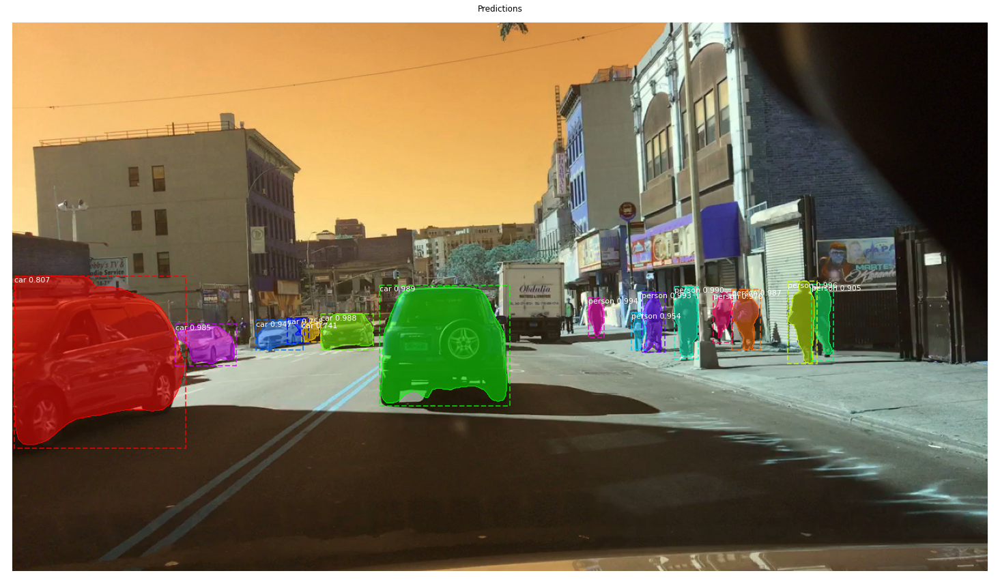

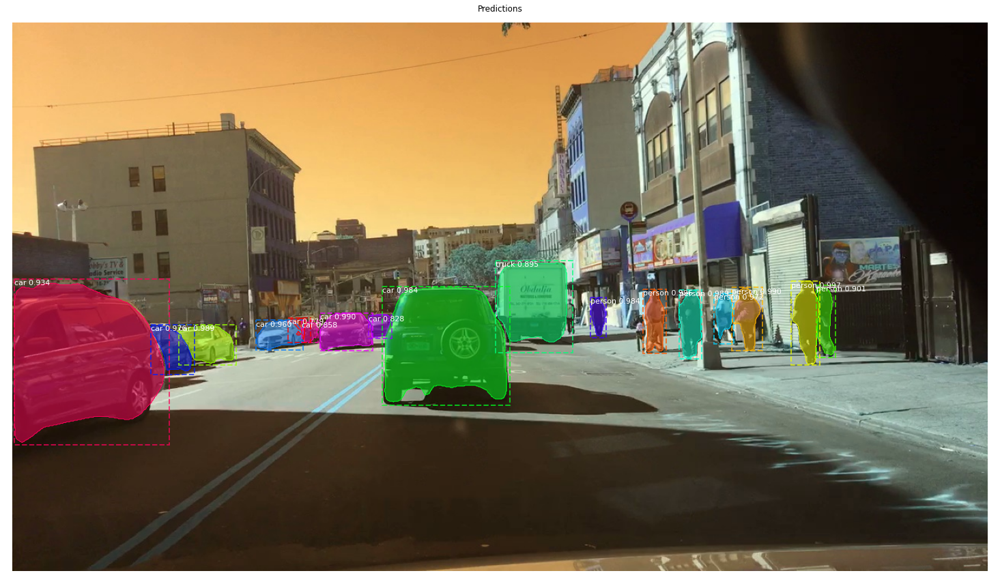

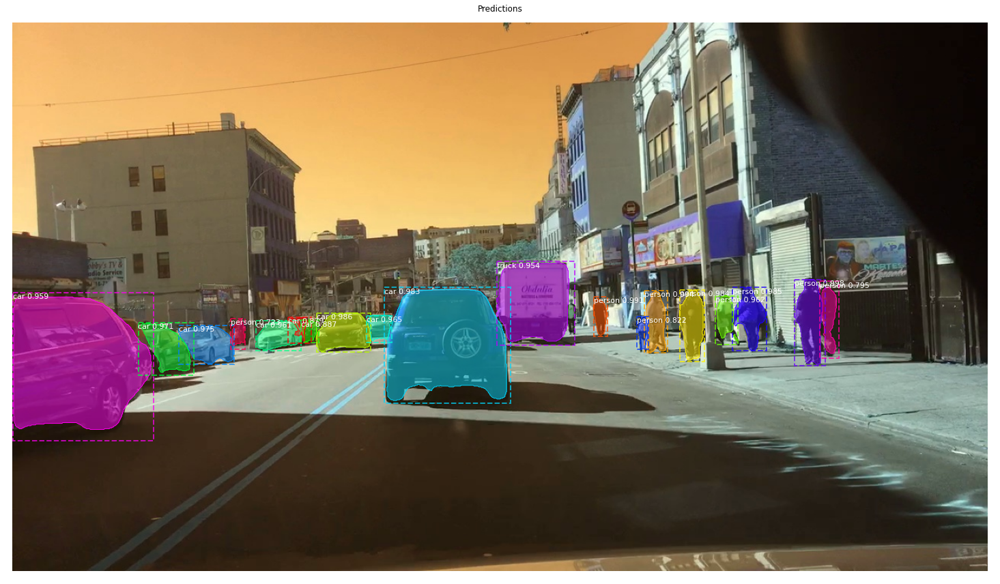

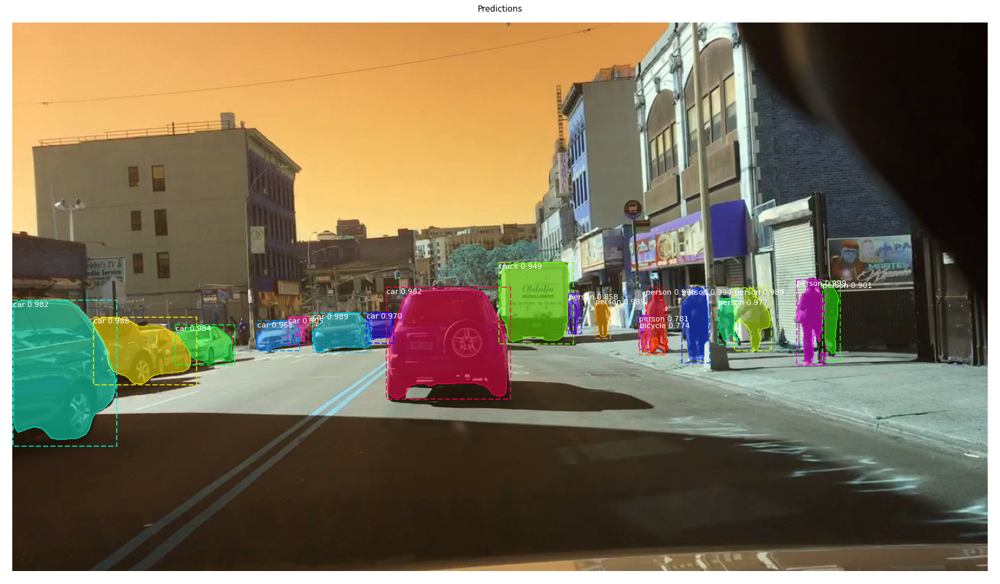

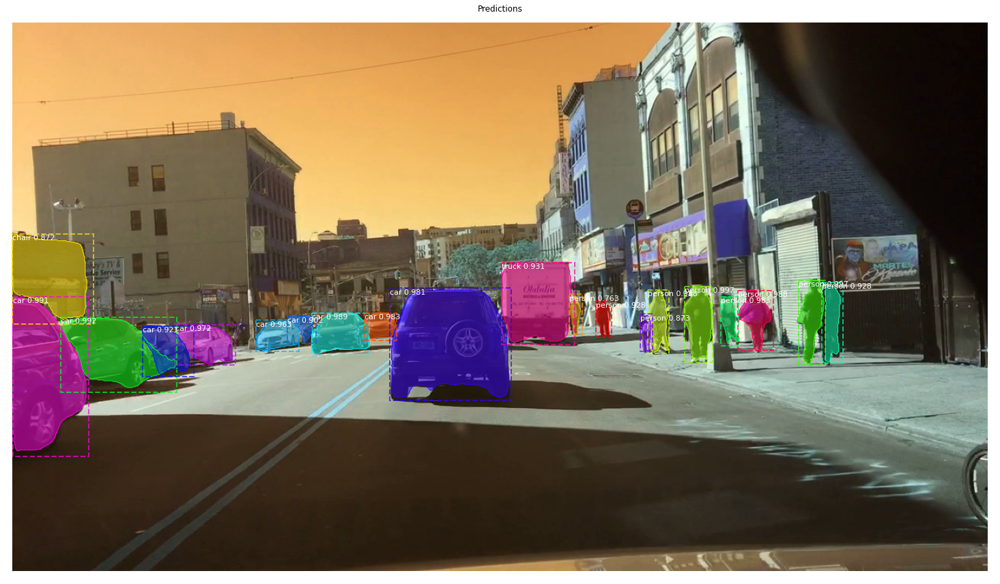

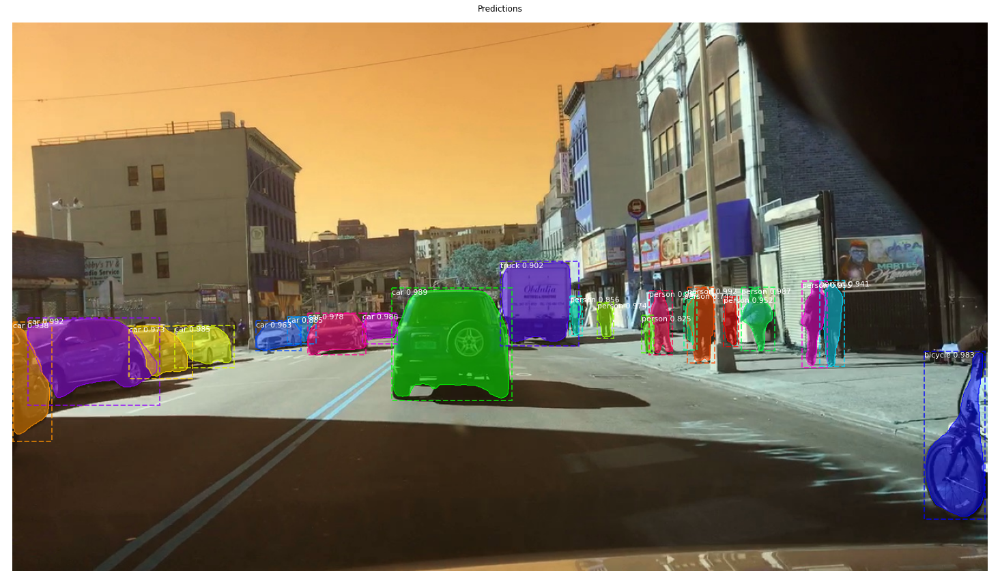

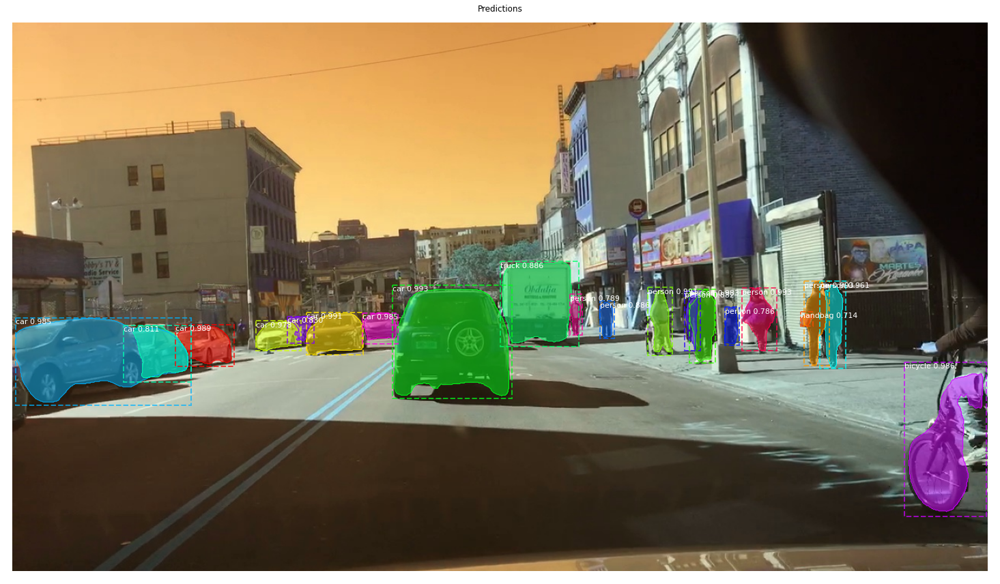

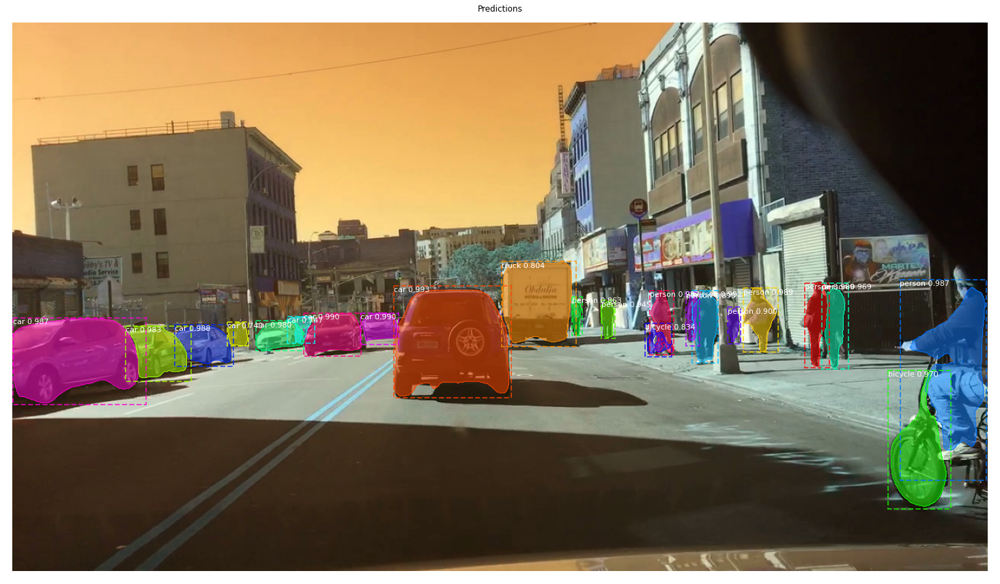

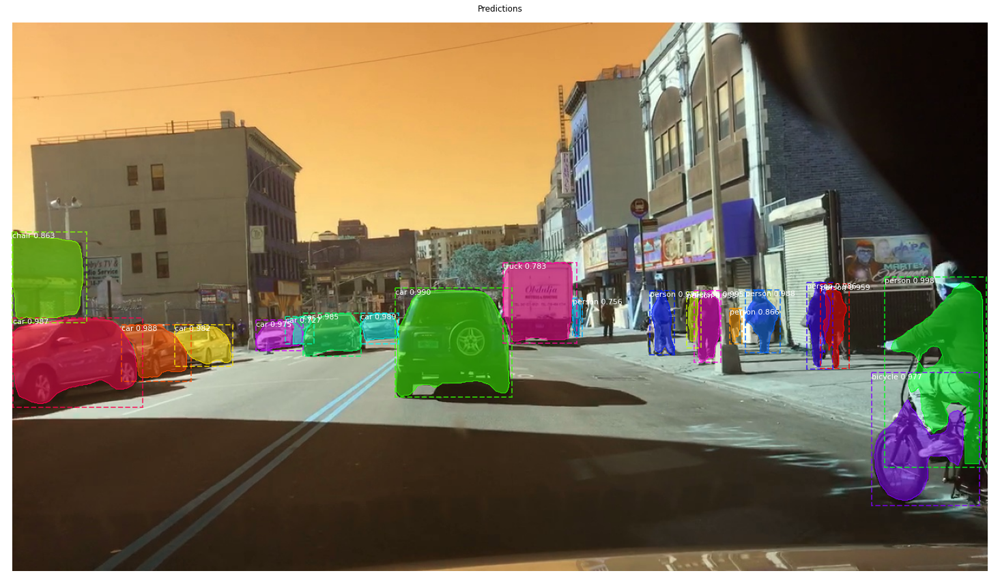

In [13]:
test_annos = dict()


for i in range(9):
    
    image_path = os.path.join(frames_dir,frames_list[i]) 
    print(image_path)
    image = cv2.imread(image_path)
    _, ax = plt.subplots(1, figsize=(26, 26))
    height, width = image.shape[:2]
    
    # Run object detection
    results = model.detect([image], verbose=1)

    # Display results
    #ax = get_ax(1)
    r = results[0]
    #fig=plt.figure(figsize=(18,16), dpi= 80, facecolor='w', edgecolor='k')
    image_ir = visualize.display_instances(image, r['rois'], r['masks'], r['class_ids'], 
                                class_names, r['scores'], ax=ax,
                                title="Predictions")
    #ax.imshow(image_ir.astype(np.uint8))
    plt.savefig(os.path.join(output_dir,frames_list[i]), bbox_inches='tight')
    #cv2.imwrite(os.path.join(output_image_path,image_list[i]),plt)
    

    test_annos[i] = {frames_list[i] : {'objects': ([class_names[predicted_class_name] for predicted_class_name in r['class_ids']], 
                                                r['scores'].tolist(),  
                                                r['rois'].tolist(),
                                                class_names,
                                                width, height)}}
    if i==9:
        break
